# Background removal with PCA

This notebook introduce a *cool* PCA application to segment video surveillance video into **background/foreground**. A video surveillance is a continuous **consant** representation  and any passenger or object will be considered as additionnal (noise) to the video. Hence, we will apply **PCA** to a discretisation of

In [2]:
import moviepy.editor as mpe
from glob import glob
import sys, os
import numpy as np
import scipy
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['image.cmap']='gray'

In [3]:
# Numerical tolerance
TOL = 1e-8

# reading the video

In [72]:
video = mpe.VideoFileClip("data/Video_003.avi").subclip(15,45)

In [73]:
#taking a subcli from 0 to 50 and display it
video.ipython_display(width=400,height=300)

chunk:   0%|          | 0/662 [00:00<?, ?it/s, now=None]

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in %s


t:   1%|          | 10/900 [00:00<00:09, 96.64it/s, now=None]      

MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


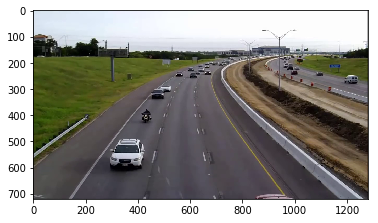

In [75]:
#print the video duration
A = video.get_frame(0.5)
plt.imshow(A)

## Helper methods
Let's create some helper methods to process the data

In [4]:
from skimage.color import rgb2gray
from skimage.transform import resize

In [5]:
def create_data_matrix_from_video(clip, k=5, img_size=(100,100)):
    """
    Function to create an image matrix from a given video: The creation process will:
    """
    return np.vstack([resize(rgb2gray(clip.get_frame(i/float(k))), img_size).flatten() for i in range(k*clip.duration)])

In [78]:
img_size= (200,200)
M = create_data_matrix_from_video(video,img_size=img_size)

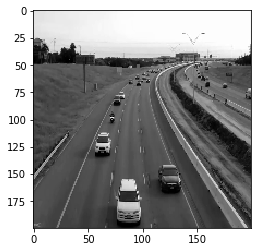

In [66]:
plt.imshow(M[0].reshape(img_size))

In [67]:
print(img_size, M.shape)

(200, 200) (75, 40000)


To avoid recomputing the main matrix $M$, we will save it with numpy ( Could also use pickle)

In [68]:
np.save("low_res_matrix.npy",M,allow_pickle=True)

### Loading the matrix

In [6]:
M = np.load('low_res_matrix.npy')
print(M.shape)

(150, 40000)


 Let's also plot to see the variations


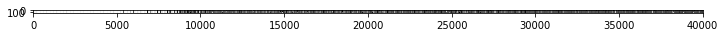

In [7]:
plt.figure(figsize=(12,12))
plt.imshow(M)

## SVD 
As a first attempt, we will apply the normal implementation of **PCA** to extract the principal components

In [8]:
from sklearn.decomposition import randomized_svd

In [9]:
U, S, V = randomized_svd(M,2)

In [10]:
U.shape, S.shape, V.shape

((150, 2), (2,), (2, 40000))

In [12]:
# let's reconsruct the low randk matrix
low_rank = U @ np.diag(S) @ V

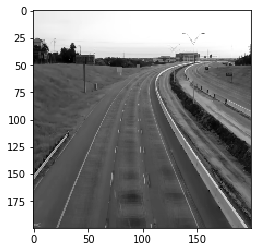

In [18]:
img_size= (200,200)
plt.imshow(low_rank[0].reshape(img_size))  

 Simply amazing !!!!

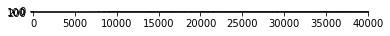

In [20]:
plt.imshow(low_rank)

We could assess that the imae has no variation, hence contains only the background

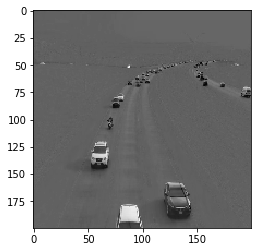

In [24]:
#lets plot the difference to show the only the vehicules
index = 1
vehicules = (M[index] - low_rank[index]).reshape(img_size)
plt.imshow(vehicules)

## Principal Component Analysis (PCA)

When dealing with high-dimensional data sets, we often leverage on the fact that the data has **low intrinsic dimensionality** in order to alleviate the curse of dimensionality and scale (perhaps it lies in a low-dimensional subspace or lies on a low-dimensional manifold). [Principal component analysis](http://setosa.io/ev/principal-component-analysis/) is handy for eliminating dimensions.  Classical PCA seeks the best rank-$k$ estimate $L$ of $M$ (minimizing $\| M - L \|$ where $L$ has rank-$k$).  Truncated SVD makes this calculation!

Traditional PCA can handle small noise, but is brittle with respect to grossly corrupted observations-- even one grossly corrupt observation can significantly mess up answer.

**Robust PCA** factors a matrix into the sum of two matrices, $M = L + S$, where $M$ is the original matrix, $L$ is **low-rank**, and $S$ is **sparse**.  This is what we'll be using for the background removal problem! **Low-rank** means that the matrix has a lot of redundant information-- in this case, it's the background, which is the same in every scene (talk about redundant info!).  **Sparse** means that the matrix has mostly zero entries-- in this case, see how the picture of the foreground (the people) is mostly empty.  (In the case of corrupted data, $S$ is capturing the corrupted entries).